<a href="https://colab.research.google.com/github/kyeongxseon/Object-Detection-Project/blob/main/people_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 0. 환경설정

In [ ]:
# 코랩 사용 시 구글 드라이브 연결
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ROOT_PATH 확인 
import os

WORK_SPACE = "/Colab Notebooks/project"

if os.getcwd() == '/content' :
  # 구글 드라이브 사용 시 
  ROOT_PATH = "/content/drive/MyDrive" + WORK_SPACE 
else :
  ROOT_PATH = os.path.abspath('..')

### 1) YOLO 설치

In [ ]:
# UltraLytics git에서 복사하기
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14421, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 14421 (delta 14), reused 19 (delta 8), pack-reused 14379
Receiving objects: 100% (14421/14421), 13.40 MiB | 32.37 MiB/s, done.
Resolving deltas: 100% (9964/9964), done.


In [ ]:
%pwd

'/content'

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
# yolov5 폴더 이동 및 requirements.txt 내부 패키지 설치
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 5.0 MB/s 


## 1. 데이터 불러오기

In [ ]:
%pwd

'/content/yolov5'

In [ ]:
%cd ..

/content


In [ ]:
# 실습해보세요 - [방법1]
!pip install roboflow

from roboflow import Roboflow

rf = Roboflow(api_key="y9FK4BL2ndZFkDiSsn63")
project = rf.workspace("pelicane").project("crowd_images")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 7.0 MB/s 
     |████████████████████████████████| 178 kB 46.7 MB/s 
     |████████████████████████████████| 67 kB 7.4 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 138 kB 66.2 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.17-py3-none-any.whl size=31935 sha256=68054404de2493c910399a585a665c48694a1df305f0eebae67a65aec3c90629
  Stored in directory: /root/.cache/pip/wheels/f2/38/3c/b4ac4d8a9d9b44bdcd51f6148ec810b0f05a404e5fed8df48d
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=81d9410376eeada2c1a510aebf0e8a2b0d04242c3d2f9f6dc4abc92dc910b0ac
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting un

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to crowd_images-2 in yolov5pytorch:: 100%|██████████| 3564/3564 [00:01<00:00, 2381.26it/s]


## 2. Train / Test 데이터 확인

In [ ]:
import glob

In [ ]:
# 실습해보세요
# DATA_PATH 지정하기
DATA_PATH = "/content/crowd_images-2/"
TRAIN_PATH = "/content/crowd_images-2/train"
VALIDATION_PATH = "/content/crowd_images-2/valid"

train_image_list = glob.glob(TRAIN_PATH + "/images/*.jpg")
validation_image_list = glob.glob(VALIDATION_PATH + "/images/*.jpg")

In [ ]:
print("학습 데이터(이미지) 개수 : " + str(len(train_image_list)))
print("검증 데이터(이미지) 개수 : " + str(len(validation_image_list)))

학습 데이터(이미지) 개수 : 1399
검증 데이터(이미지) 개수 : 255


## 3. Yaml 파일 수정하기

In [ ]:
import yaml

In [ ]:
# 실습해보세요.
with open('/content/crowd_images-2/data.yaml', 'r') as f:
  data = yaml.load(f, Loader=yaml.FullLoader)

print(data)

{'names': ['people'], 'nc': 1, 'train': '/content/crowd_images-2/train/images', 'val': '/content/crowd_images-2/valid/images'}


In [ ]:
# 실습해보세요
with open(DATA_PATH + '/train.txt', 'w') as f:
    f.write('\n'.join(train_image_list) + '\n')

with open(DATA_PATH + '/validation.txt', 'w') as f:
    f.write('\n'.join(validation_image_list) + '\n')

In [ ]:
data['train'] = DATA_PATH + '/train.txt'
data['val'] = DATA_PATH + '/validation.txt'

with open(DATA_PATH + '/data.yaml', 'w') as f:
  yaml.dump(data, f)

print(data)

{'names': ['people'], 'nc': 1, 'train': '/content/crowd_images-2//train.txt', 'val': '/content/crowd_images-2//validation.txt'}


## 4. Yolov5를 이용한 모델 학습

In [ ]:
%pwd

'/content/yolov5'

In [ ]:
%cd yolov5

[Errno 2] No such file or directory: 'yolov5'
/content/yolov5


In [ ]:
# 실습해보세요.
!python train.py --img 416 --batch 16 --epochs 10 --data /content/crowd_images-2/data.yaml --weights yolov5s.pt --name people_detection

train: weights=yolov5s.pt, cfg=, data=/content/crowd_images-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=people_detection, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-210-gf9bb984 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, 

## 5. Test 데이터 추론하기

In [ ]:
import zipfile

In [ ]:
zip_file = "/content/object_detection_images.zip"

  
with zipfile.ZipFile(zip_file) as z:
    z.extractall("/content")

os.remove(zip_file) 

In [ ]:
# 경로 설정
TEST_IMAGE_PATH = "/content/data/test/images"

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
# 실습해보세요
!python detect.py --source '{TEST_IMAGE_PATH}' --weights /content/yolov5/runs/train/people_detection2/weights/best.pt --img 416 --conf 0.3

detect: weights=['/content/yolov5/runs/train/people_detection2/weights/best.pt'], source=/content/data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-210-gf9bb984 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/3 /content/data/test/images/a.jpg: 320x416 6 peoples, 11.1ms
image 2/3 /content/data/test/images/s.jpg: 288x416 28 peoples, 11.9ms
image 3/3 /content/data/test/images/sfd.jpg: 192x416 34 peoples, 17.6ms
Speed: 0.3ms pre-process, 13.5ms inference, 1.2ms NMS per image at shape (1, 3, 416, 416)
Results sa

In [ ]:
# 필요 라이브러리 불러오기
from PIL import Image               # to load images
from IPython.display import display # to display images

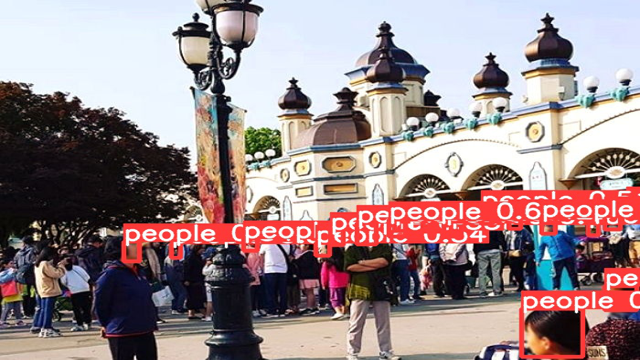

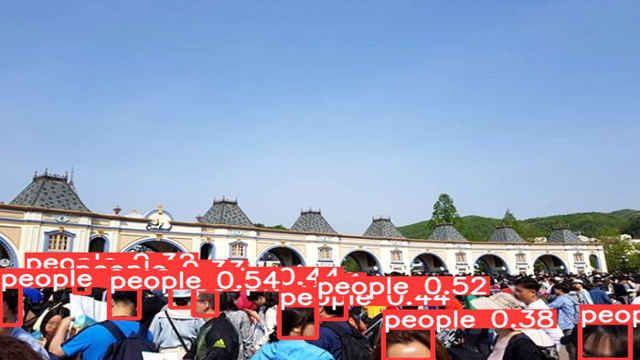

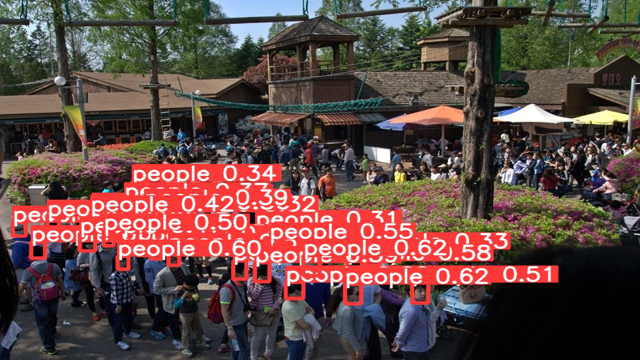

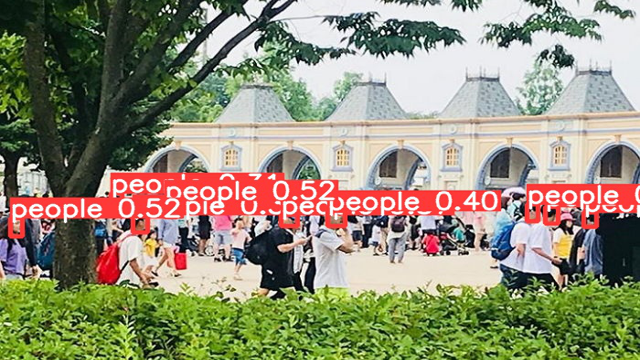

In [ ]:
# 실습해보세요.
detect_image_path = "/content/yolov5/runs/detect/exp3"  #detect가 완료된 파일의 경로

for i in glob.glob(detect_image_path + '/*.jpg'):
  img = Image.open(i)
  img_resize = img.resize((640, 360))
  display(img_resize)
  print('\n')


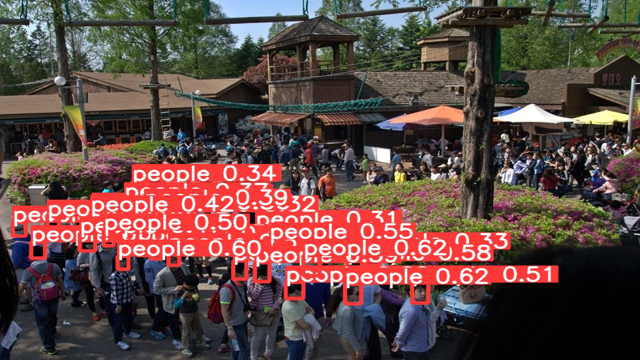

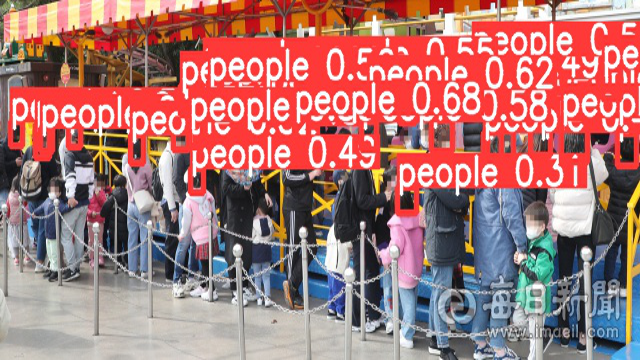

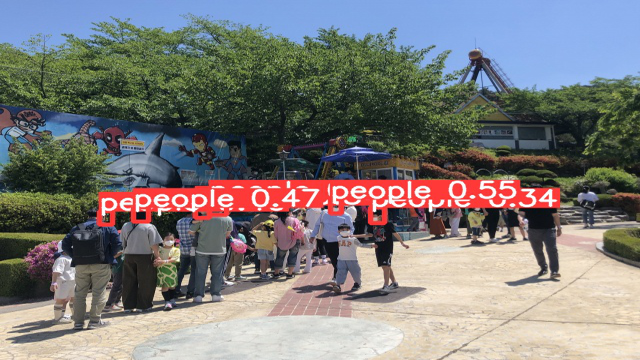

In [ ]:
# 실습해보세요.
detect_image_path = "/content/yolov5/runs/detect/exp4"  #detect가 완료된 파일의 경로

for i in glob.glob(detect_image_path + '/*.jpg'):
  img = Image.open(i)
  img_resize = img.resize((640, 360))
  display(img_resize)
  print('\n')


In [ ]:
TEST_VIDEO_PATH = "/content/data/test/video/test_video_01.mp4"

In [ ]:
# 실습해보세요
!python detect.py --source '{TEST_VIDEO_PATH}' --weights /content/yolov5/runs/train/people_detection2/weights/best.pt --conf 0.3 --img 256

detect: weights=['/content/yolov5/runs/train/people_detection2/weights/best.pt'], source=/content/data/test/video/test_video_01.mp4, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-210-gf9bb984 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/3288) /content/data/test/video/test_video_01.mp4: 160x256 4 peoples, 10.9ms
video 1/1 (2/3288) /content/data/test/video/test_video_01.mp4: 160x256 4 peoples, 7.2ms
video 1/1 (3/3288) /content/data/test/video/test_video_01.mp4: 160x256 4 peoples, 7.0ms
video 1/1 (4/3288) /content/d

In [ ]:
# 실습해보세요.
detect_video = '/content/yolov5/runs/detect/exp6/test_video_01.mp4' # 경로 수정

# 비디오 데이터 압축 (Colab에서 실행 목적)
def video_compressing(detect_video):  
  compressed_video = detect_video[:-4] + "_compressed.mp4"
  os.system(f"ffmpeg -i {detect_video} -vcodec libx264 {compressed_video}")

  return compressed_video 

In [ ]:
compressed_video = video_compressing(detect_video)

from IPython.display import HTML
from base64 import b64encode

mp4 = open(compressed_video,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
    <source src="%s" type="video/mp4">
</video>
""" % data_url)